<a href="https://colab.research.google.com/github/astrrr/Image-Processing-Lab/blob/main/Activity4_image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import img_to_array
from numpy import expand_dims
from scipy import signal

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 4.1 VGG16 MODEL PARAMETERS

# Read image

In [ ]:
img = cv2.imread('/content/drive/MyDrive/dataset/Images_of_Waste/train/Glass/Glass16.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (224, 224))

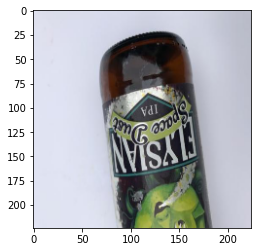

In [ ]:
plt.imshow(img)
plt.show()

# Load VGG16

In [ ]:
model = VGG16()

# Model detail 

In [ ]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

# Retrieve kernel weights from the 1st Convolutional layer

In [ ]:
kernels, biases = model.layers[1].get_weights()

In [ ]:
kernels

array([[[[ 4.29470569e-01,  1.17273867e-01,  3.40129584e-02, ...,
          -1.32241577e-01, -5.33475243e-02,  7.57738389e-03],
         [ 5.50379455e-01,  2.08774377e-02,  9.88311544e-02, ...,
          -8.48205537e-02, -5.11389151e-02,  3.74943428e-02],
         [ 4.80015397e-01, -1.72696680e-01,  3.75577137e-02, ...,
          -1.27135560e-01, -5.02991639e-02,  3.48965675e-02]],

        [[ 3.73466998e-01,  1.62062630e-01,  1.70863140e-03, ...,
          -1.48207128e-01, -2.35300660e-01, -6.30356818e-02],
         [ 4.40074533e-01,  4.73412387e-02,  5.13819456e-02, ...,
          -9.88498852e-02, -2.96195745e-01, -7.04357103e-02],
         [ 4.08547401e-01, -1.70375049e-01, -4.96297423e-03, ...,
          -1.22360572e-01, -2.76450396e-01, -3.90796512e-02]],

        [[-6.13601133e-02,  1.35693997e-01, -1.15694344e-01, ...,
          -1.40158370e-01, -3.77666801e-01, -3.00509870e-01],
         [-8.13870355e-02,  4.18543853e-02, -1.01763301e-01, ...,
          -9.43124294e-02, -5.0566

# View CNN layer 1 architecture

In [ ]:
model.layers[1].get_config()

{'activation': 'relu',
 'activity_regularizer': None,
 'bias_constraint': None,
 'bias_initializer': {'class_name': 'Zeros', 'config': {}},
 'bias_regularizer': None,
 'data_format': 'channels_last',
 'dilation_rate': (1, 1),
 'dtype': 'float32',
 'filters': 64,
 'groups': 1,
 'kernel_constraint': None,
 'kernel_initializer': {'class_name': 'GlorotUniform',
  'config': {'seed': None}},
 'kernel_regularizer': None,
 'kernel_size': (3, 3),
 'name': 'block1_conv1',
 'padding': 'same',
 'strides': (1, 1),
 'trainable': True,
 'use_bias': True}

# Preprocess Image using keras and numpy


*   convert the image to an array




In [ ]:
img = img_to_array(img)



*   Expand dimensions so that it represents a single 'sample’ -> reshape 3D(H,W,Ch) image to 4D image (sample,H,W,Ch)




In [ ]:
img.shape

(224, 224, 3)

In [ ]:
img = expand_dims(img, axis=0)

In [ ]:
img.shape

(1, 224, 224, 3)



*   Prepare the image (e.g. scale pixel values for the vgg)




In [ ]:
img

array([[[[226., 228., 241.],
         [225., 227., 240.],
         [224., 226., 239.],
         ...,
         [187., 189., 202.],
         [187., 189., 202.],
         [187., 189., 202.]],

        [[225., 227., 240.],
         [225., 227., 240.],
         [224., 226., 239.],
         ...,
         [187., 189., 202.],
         [187., 189., 202.],
         [187., 189., 202.]],

        [[225., 227., 240.],
         [224., 226., 239.],
         [223., 225., 238.],
         ...,
         [187., 189., 202.],
         [187., 189., 202.],
         [187., 189., 202.]],

        ...,

        [[230., 232., 247.],
         [229., 231., 246.],
         [228., 230., 245.],
         ...,
         [208., 207., 221.],
         [209., 208., 222.],
         [210., 209., 223.]],

        [[230., 232., 247.],
         [230., 232., 247.],
         [229., 231., 246.],
         ...,
         [208., 207., 221.],
         [209., 208., 222.],
         [210., 209., 223.]],

        [[231., 233., 248.],
       

In [ ]:
img_ready = preprocess_input(img)

In [ ]:
img_ready

array([[[[137.061, 111.221, 102.32 ],
         [136.061, 110.221, 101.32 ],
         [135.061, 109.221, 100.32 ],
         ...,
         [ 98.061,  72.221,  63.32 ],
         [ 98.061,  72.221,  63.32 ],
         [ 98.061,  72.221,  63.32 ]],

        [[136.061, 110.221, 101.32 ],
         [136.061, 110.221, 101.32 ],
         [135.061, 109.221, 100.32 ],
         ...,
         [ 98.061,  72.221,  63.32 ],
         [ 98.061,  72.221,  63.32 ],
         [ 98.061,  72.221,  63.32 ]],

        [[136.061, 110.221, 101.32 ],
         [135.061, 109.221, 100.32 ],
         [134.061, 108.221,  99.32 ],
         ...,
         [ 98.061,  72.221,  63.32 ],
         [ 98.061,  72.221,  63.32 ],
         [ 98.061,  72.221,  63.32 ]],

        ...,

        [[143.061, 115.221, 106.32 ],
         [142.061, 114.221, 105.32 ],
         [141.061, 113.221, 104.32 ],
         ...,
         [117.061,  90.221,  84.32 ],
         [118.061,  91.221,  85.32 ],
         [119.061,  92.221,  86.32 ]],

        [[

In [ ]:
img_ready.shape

(1, 224, 224, 3)

# Extract Model CNN Layer 1

In [ ]:
model = Model(inputs=model.inputs, outputs=model.layers[1].output)
model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
Total params: 1,792
Trainable params: 1,792
Non-trainable params: 0
_________________________________________________________________


# Extract Results from CNN Layer 1 called feature map (shape = (sample = 1, 224, 224, n_filters) )



*   CNN Layer 1 -> n_filters = 64



In [ ]:
feature_maps = model.predict(img_ready)

In [ ]:
feature_maps.shape

(1, 224, 224, 64)

# Display images of feature_maps

In [ ]:
def displayFilter(feature_map):
  plt.figure(figsize=(224,224))
  for i in range(64):
    plt.subplot(8, 8, i+1)
    plt.imshow(feature_map[0,:,:,i], cmap='jet')
    plt.axis('on')
  plt.show()

In [ ]:
displayFilter(feature_maps)

# 4.2 IMAGE PREPARATION (FROM SCRATCH)

# # Image reshape from 3D image (H, W, Ch) -> 4D image (1, H, W, Ch)

In [ ]:
img = cv2.imread('/content/drive/MyDrive/dataset/Images_of_Waste/train/Glass/Glass16.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

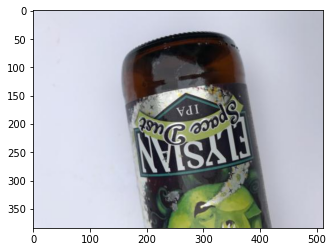

In [ ]:
plt.imshow(img)
plt.show()

In [ ]:
img = cv2.resize(img, (224,224))

In [ ]:
img.shape

(224, 224, 3)

In [ ]:
img = np.expand_dims(img,axis=0)

In [ ]:
img.shape

(1, 224, 224, 3)

In [ ]:
b = np.mean(img[0,:,:,0])
g = np.mean(img[0,:,:,1])
r = np.mean(img[0,:,:,2])

In [ ]:
img_mean = np.array([b,g,r])

In [ ]:
print('mean b : ',b)
print('mean g : ',g)
print('mean r : ',r)

mean b :  164.1875
mean g :  166.71693638392858
mean r :  171.83057637117346


In [ ]:
img[0,:,:,0] = np.subtract(img[0,:,:,0],b) 
img[0,:,:,1] = np.subtract(img[0,:,:,0],g)
img[0,:,:,2] = np.subtract(img[0,:,:,0],r)

In [ ]:
img[0,:,:,0]

array([[61, 60, 59, ..., 22, 22, 22],
       [60, 60, 59, ..., 22, 22, 22],
       [60, 59, 58, ..., 22, 22, 22],
       ...,
       [65, 64, 63, ..., 43, 44, 45],
       [65, 65, 64, ..., 43, 44, 45],
       [66, 65, 64, ..., 43, 44, 45]], dtype=uint8)

In [ ]:
img[0,:,:,1]

array([[151, 150, 149, ..., 112, 112, 112],
       [150, 150, 149, ..., 112, 112, 112],
       [150, 149, 148, ..., 112, 112, 112],
       ...,
       [155, 154, 153, ..., 133, 134, 135],
       [155, 155, 154, ..., 133, 134, 135],
       [156, 155, 154, ..., 133, 134, 135]], dtype=uint8)

In [ ]:
img[0,:,:,2]

array([[146, 145, 144, ..., 107, 107, 107],
       [145, 145, 144, ..., 107, 107, 107],
       [145, 144, 143, ..., 107, 107, 107],
       ...,
       [150, 149, 148, ..., 128, 129, 130],
       [150, 150, 149, ..., 128, 129, 130],
       [151, 150, 149, ..., 128, 129, 130]], dtype=uint8)

# Color conversion

*   RGB -> BGR




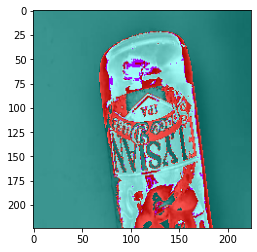

In [ ]:
plt.imshow(img[0,:,:,:])
plt.show()

In [ ]:
img.shape

(1, 224, 224, 3)

In [ ]:
img = np.squeeze(img,axis=0)


In [ ]:
img.shape

(224, 224, 3)

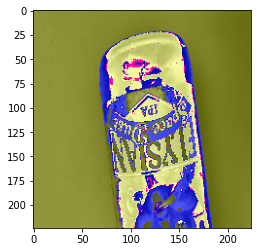

In [ ]:
rgb_img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
plt.imshow(rgb_img)
plt.show()

In [ ]:
bgr_img = rgb_img

# 4.3 Conv2D()

# operate 2D convolution to image from 4.2 (imgBGR)

*   image convolution with kernel แยกแต่ละ color channel (ทํา ทุก color channel)




In [ ]:
def img_conv_with_kernels(bgr_img,kernels):
  img_result = np.empty((64, 224, 224 ,3))
  tmp = np.empty((224,224,3))
  for i in range(64):
    tmp[: , :, 0] = signal.convolve2d( bgr_img[ : , : , 0], kernels[: , : , 0,i] , mode='same',boundary='fill', fillvalue=0)
    tmp[: , :, 1] = signal.convolve2d( bgr_img[ : , : , 1], kernels[: , : , 1,i] , mode='same',boundary='fill', fillvalue=0)
    tmp[: , :, 2] = signal.convolve2d( bgr_img[ : , : , 2], kernels[: , : , 2,i] , mode='same',boundary='fill', fillvalue=0)
    img_result[i,:,:,0] = tmp[: , :, 0]
    img_result[i,:,:,1] = tmp[: , :, 1]
    img_result[i,:,:,2] = tmp[: , :, 2]
  return img_result

In [ ]:
result_conv = img_conv_with_kernels(bgr_img,kernels)

In [ ]:
result_conv.shape

(64, 224, 224, 3)

# Sum image convolutional results of B,G,R

In [ ]:
Image_sum = result_conv[ :,: , : , 0] + result_conv[:, : , : , 1] + result_conv[:, : , : , 2]

In [ ]:
Image_sum

array([[[ 4.43484131e+02,  2.69250076e+02,  2.66731709e+02, ...,
          1.85067739e+02,  1.85067739e+02, -8.04210472e+00],
        [ 3.16095871e+02, -6.84471321e+00, -6.62063980e+00, ...,
         -1.12945938e+00, -1.12945938e+00, -1.80403929e+02],
        [ 3.14820950e+02, -6.44368362e+00, -5.52603149e+00, ...,
         -1.12945938e+00, -1.12945938e+00, -1.80403929e+02],
        ...,
        [ 3.32034714e+02, -1.61238670e+00, -3.08563614e+00, ...,
          1.33991432e+00,  4.03723717e+00, -2.28598576e+02],
        [ 3.33309639e+02, -2.01341629e+00, -3.24924469e+00, ...,
          1.33991432e+00,  4.03723717e+00, -2.28598576e+02],
        [ 3.32502365e-01, -3.08279030e+02, -3.07070286e+02, ...,
         -2.51354713e+02, -2.51339340e+02, -3.33256245e+02]],

       [[ 7.37054329e+01,  1.10303322e+02,  1.10182957e+02, ...,
          1.04771702e+02,  1.04771702e+02,  7.84606848e+01],
        [ 1.10340149e+02,  1.63963367e+02,  1.63740185e+02, ...,
          1.55453358e+02,  1.55453358e

# Activation Function

*   image_sum < 0  ให้เปลี่ยนค่ําเป็น 0




In [ ]:
Image_sum.shape

(64, 224, 224)

In [ ]:
Image_sum = np.moveaxis(Image_sum, 0, -1)

In [ ]:
Image_sum.shape

(224, 224, 64)

In [ ]:
for i in range(224):
  for j in range(224):
    for k in range(64):
      if Image_sum[i][j][k] < 0 :
        Image_sum[i][j][k] = 0
        print('found less than zero---change value success')
  

Streaming output truncated to the last 5000 lines.
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---change value success
found less than zero---ch

In [ ]:
#Image_sum = expand_dims(Image_sum, axis=0)

In [ ]:
Image_sum.shape

(224, 224, 64)

# Display images of feature_maps

In [ ]:
#new_feature_maps = model.predict(Image_sum)

In [ ]:
#new_feature_maps.shape

In [ ]:
#new_feature_maps = np.squeeze(new_feature_maps, axis=0)

In [ ]:
def dp64filter(feature_map):
  plt.figure(figsize=(112,112))
  for i in range(64):
    plt.subplot(8, 8, i+1)
    plt.imshow(feature_map[:,:,i], cmap='jet')
    plt.axis('on')
  plt.show()

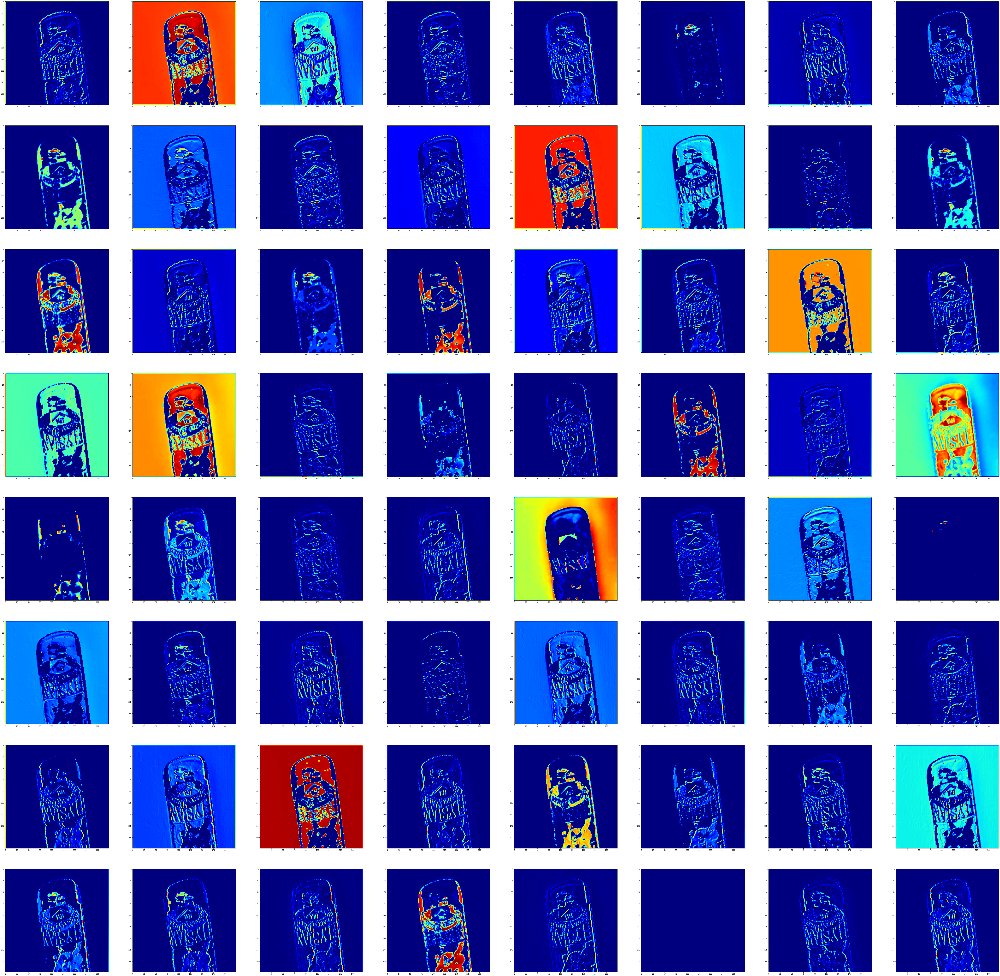

In [ ]:
dp64filter(Image_sum)